# Different types of RNNs

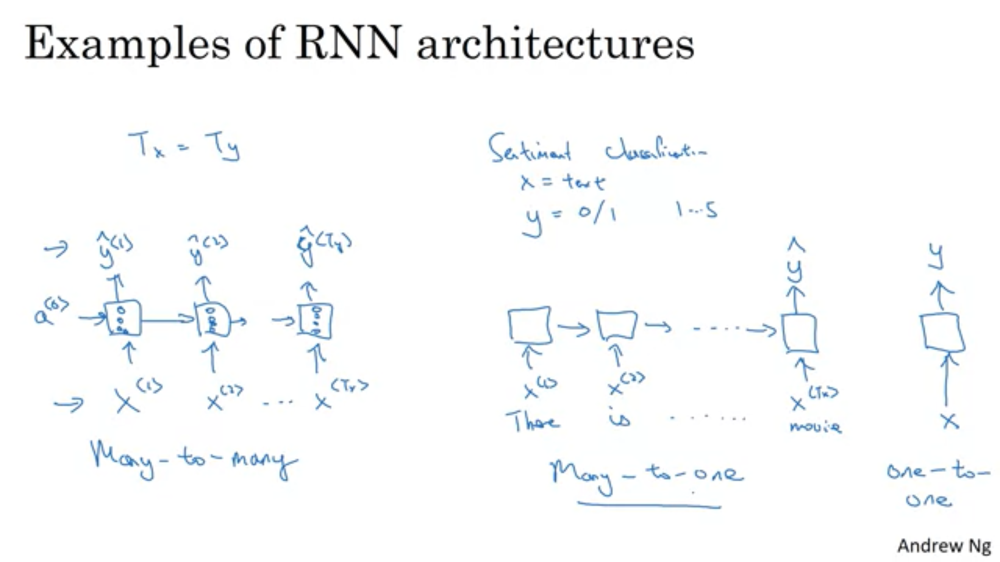

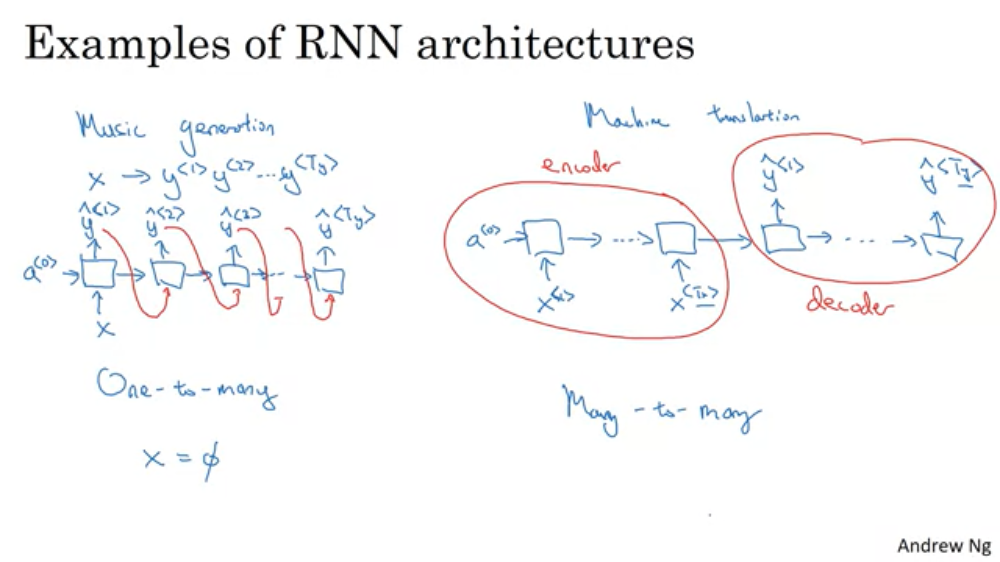

So here's an alternative new network architecture where you might have a neural network, first, reading the sentence. So first, reading the input, say French sentence that you want to translate to English. And having done that, you then, have the neural network output the translation. As all those y hat of (Ty). And so, with this architecture, Tx and Ty can be different lengths. And again, you could draw on the a(0) [inaudible]. And so, this that collinear network architecture has two distinct parts. There's the encoder which takes as input, say a French sentence, and then, there's is a decoder, which having read in the sentence, outputs the translation into a different language. So this would be an example of a many-to-many architecture.

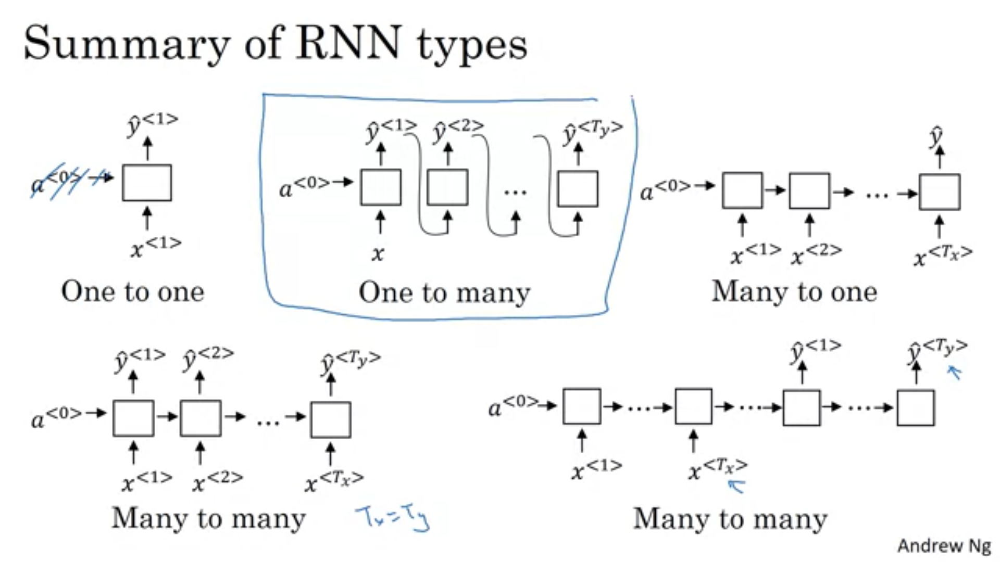

# Language model and sequence generation


Language modeling is one of the most basic and important tasks in natural language processing. There's also one that RNNs do very well.

`So what a language model does is given any sentence is job is to tell you what is the probability of a sentence, of that particular sentence.`

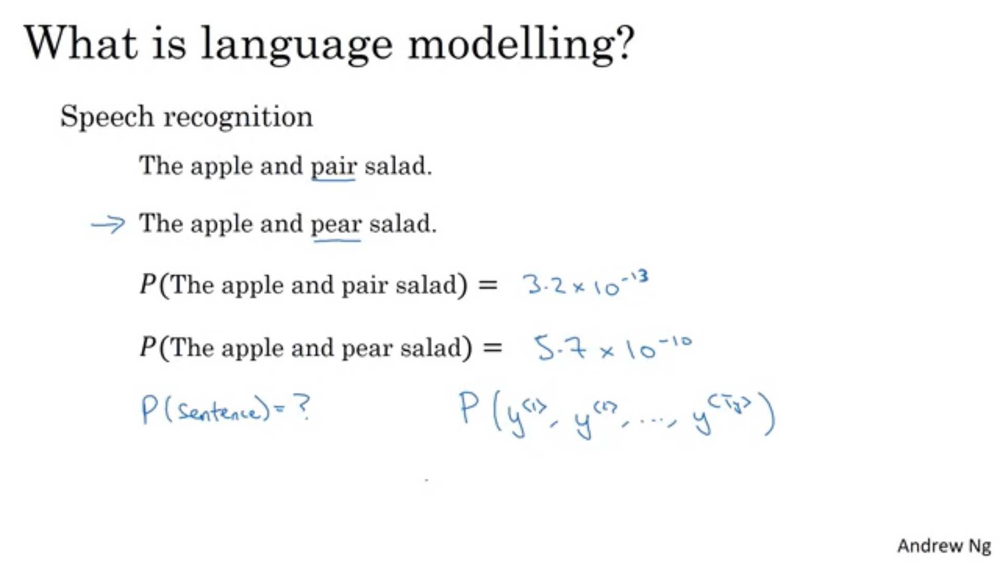


And so the basic job of a language model is to input a sentence, which I'm going to write as a sequence y(1), y(2) up to y(Ty). And for language model will be useful to represent a sentences as outputs y rather than inputs x. But what the language model does is it estimates the probability of that particular sequence of words.

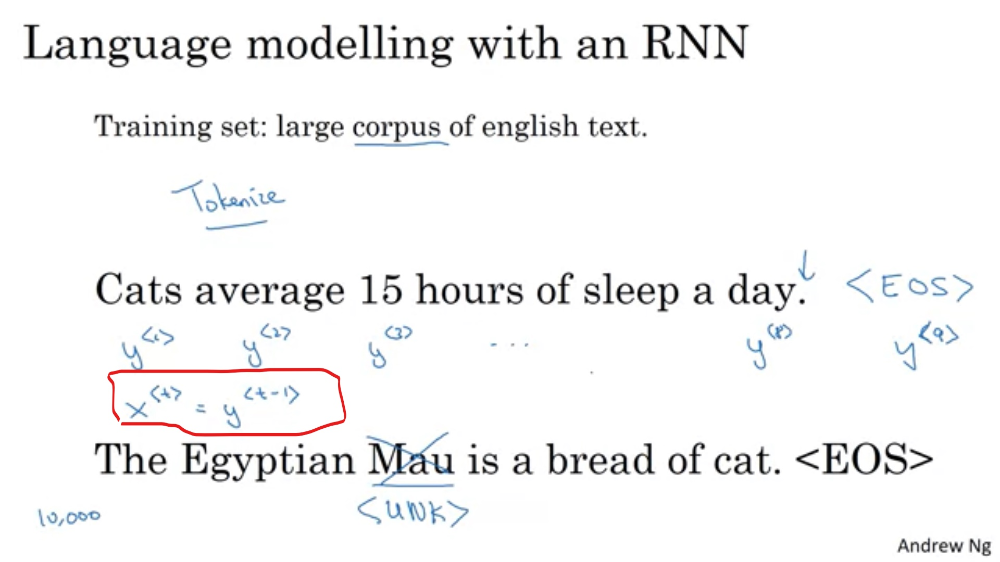

And the word `corpus` is an NLP terminology that just means a` large body or a very large set of english text of english sentences.` So let's say you get a sentence in your training set as follows. Cats average 15 hours of sleep a day. `The first thing you would do is tokenize this sentence`. And that means you would form a vocabulary as we saw in an earlier video. And then map each of these words to, say, one hunt vectors, alter indices in your vocabulary. One thing you might also want to do is model when sentences end. So another common thing to do is to add an extra token called a EOS. That stands for End Of Sentence that can help you figure out when a sentence ends.

`If Mau is not present in Dictionary.` So in that case you could take the word Mau and replace it with a unique token called UNK or stands for unknown words and would just model, the chance of the unknown word instead of the specific word now. `Having carried out the tokenization step which basically means taking the input sentence and mapping out to the individual tokens or the individual words in your vocabulary.`

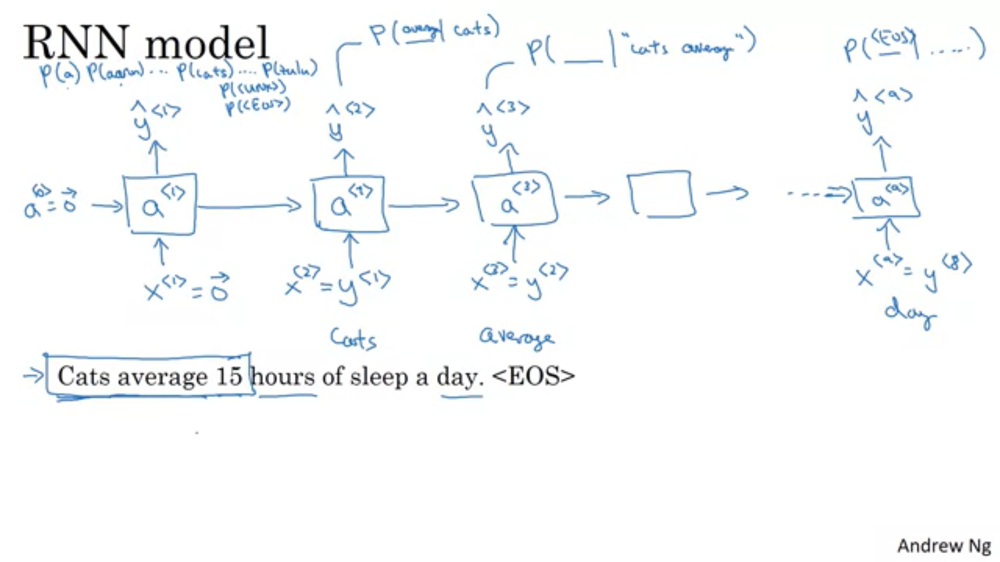

This will be an RNN architecture. At time 0 you're going to end up computing some activation a1 as a function of some inputs x1, and x1 will just be set it to the set of all zeroes, to 0 vector. And the previous A0, by convention, also set that to vector zeroes. But what A1 does is it will make a soft max prediction to try to figure out what is the probability of the first words y. And so that's going to be y<1>. So what this step does is really, it has a soft max it's trying to predict. What is the probability of any word in the dictionary? That the first one is a, what's the chance that the first word is Aaron? And then what's the chance that the first word is cats? All the way to what's the chance the first word is Zulu? Or what's the first chance that the first word is an unknown word?` Or what's the first chance that the first word is the in the sentence they'll have, shouldn't have to read? Right, so y hat 1 is output to a soft max, it just predicts what's the chance of the first word being, whatever it ends up being.`

 `So each step in the RNN will look at some set of preceding words such as, given the first three words, what is the distribution over the next word? And so this RNN learns to predict one word at a time going from left to right.`

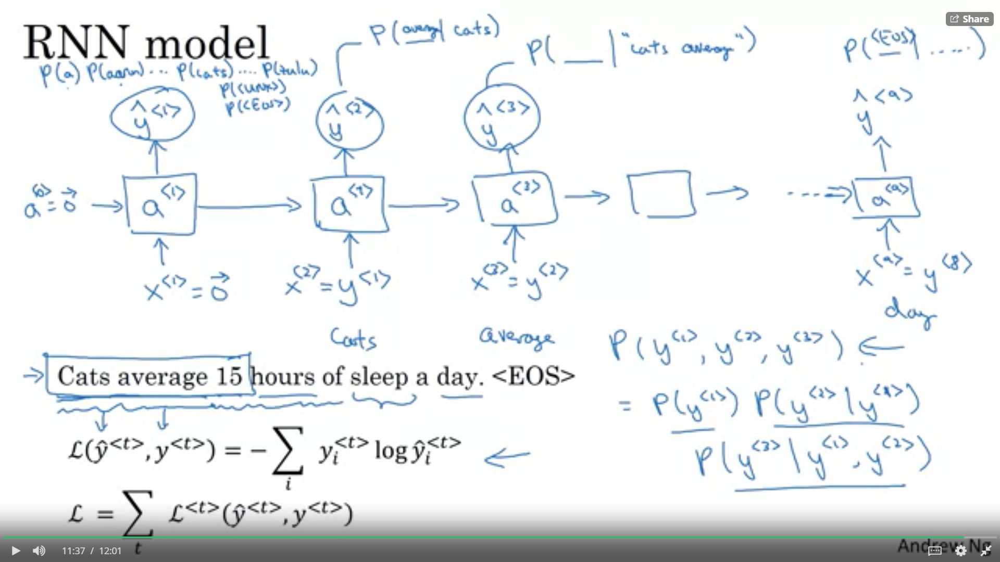

# Sampling novel sequences

After you train a sequence model, one of the ways you can informally get a sense of what is learned is to have a sample novel sequences. Let's take a look at how you could do that.
`

However, when learning, the output of an RNN is a probability distribution instead of one word. <br>
`When generating text we choose only one of the words ourselves given the probabilities and feed that back into the network. This is called sampling.`

np.random.choice() <br>
Generates a random sample from a given 1-D array <br>
np.random.choice(5, 3, p=[0.1, 0, 0.3, 0.6, 0])    from [0,4] 3 has the highest probability to be choosen <br>  
array([3, 3, 0]) # random
<br>
<br>
Now on to random sampling. Random search works by selecting the next word with the probabilities of each word taken from the output of the model (the probability distribution). For example: the word The has probability 0.8, so 8 out of 10 times the next word is The, 2 out of 10 times it will generate another word. Look at this picture for example:

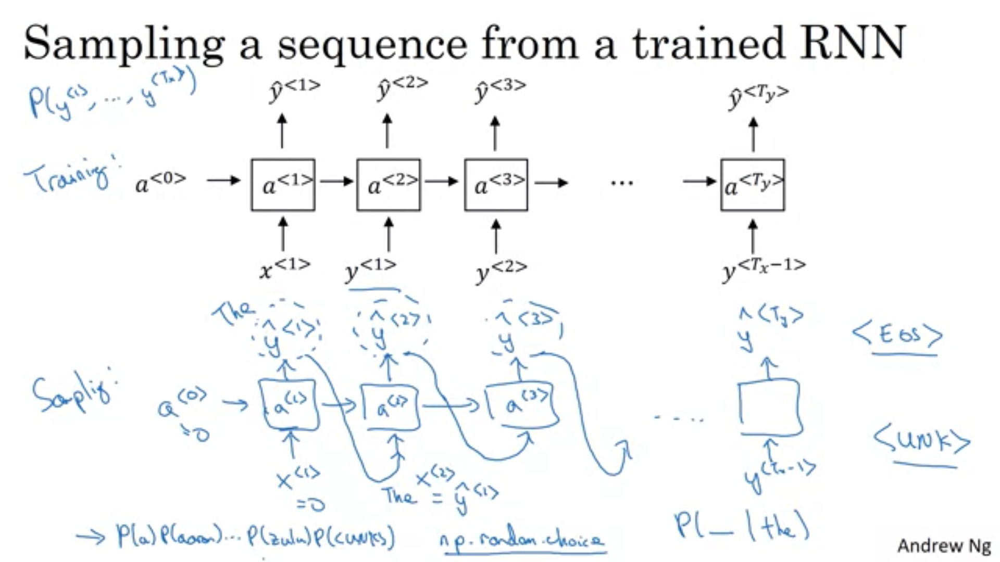

And so how do you know when the sequence ends? Well, one thing you could do is if the end of sentence token is part of your vocabulary, you could keep sampling until you generate an EOS token. And that tells you you've hit the end of a sentence and you can stop. Or alternatively, if you do not include this in your vocabulary then you can also just decide to sample 20 words or 100 words or something, and then keep going until you've reached that number of time steps.

And this particular procedure will sometimes generate an unknown word token. If you want to make sure that your algorithm never generates this token, one thing you could do is just reject any sample that came out as unknown word token and just keep resampling from the rest of the vocabulary until you get a word that's not an unknown word. 

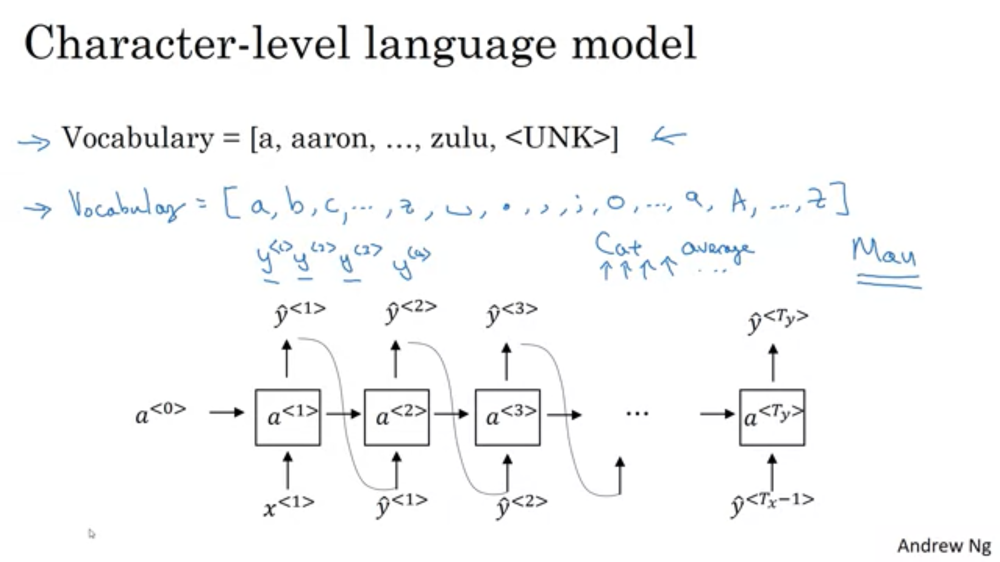

Using a character level language model has some pros and cons.
* One is that you don't ever have to worry about unknown word tokens. In particular, a character level language model is able to assign a sequence like mau, a non-zero probability. Whereas if mau was not in your vocabulary for the word level language model, you just have to assign it the unknown word token. 
* But the main disadvantage of the character level language model is that you end up with much longer sequences. So many english sentences will have 10 to 20 words but may have many, many dozens of characters. And so character language models are not as good as word level language models at capturing long range dependencies between how the the earlier parts of the sentence also affect the later part of the sentence. 
* And character level models are also just more computationally expensive to train. So the trend I've been seeing in natural language processing is that for the most part, word level language model are still used, but as computers gets faster there are more and more applications where people are, at least in some special cases, starting to look at more character level models. But they tend to be much hardware, much more computationally expensive to train, so they are not in widespread use today. 

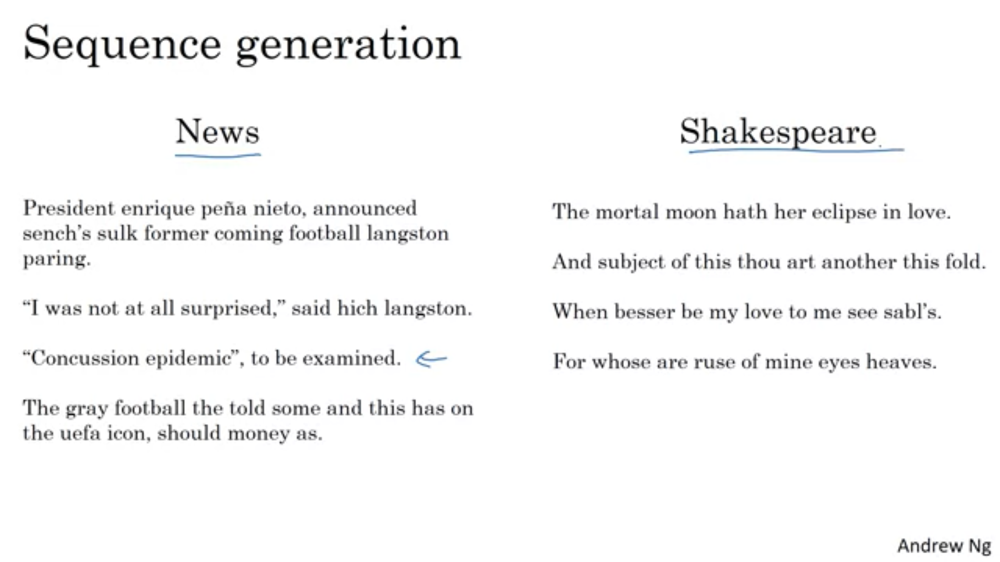

# Vanishing gradients with RNNs

 And this is one example of when language can have very long-term dependencies, where it worked at this much earlier can affect what needs to come much later in the sentence. But it turns out the basics RNN we've seen so far it's not very good at capturing very long-term dependencies.

And for an RNN with a similar problem, you have forward prop came from left to right, and then back prop, going from right to left. And it can be quite difficult, because of the same vanishing gradients problem, for the outputs of the errors associated with the later time steps to affect the computations that are earlier. And so in practice, what this means is, it might be difficult to get a neural network to realize that it needs to memorize the just see a singular noun or a plural noun, so that later on in the sequence that can generate either was or were, depending on whether it was singular or plural. 

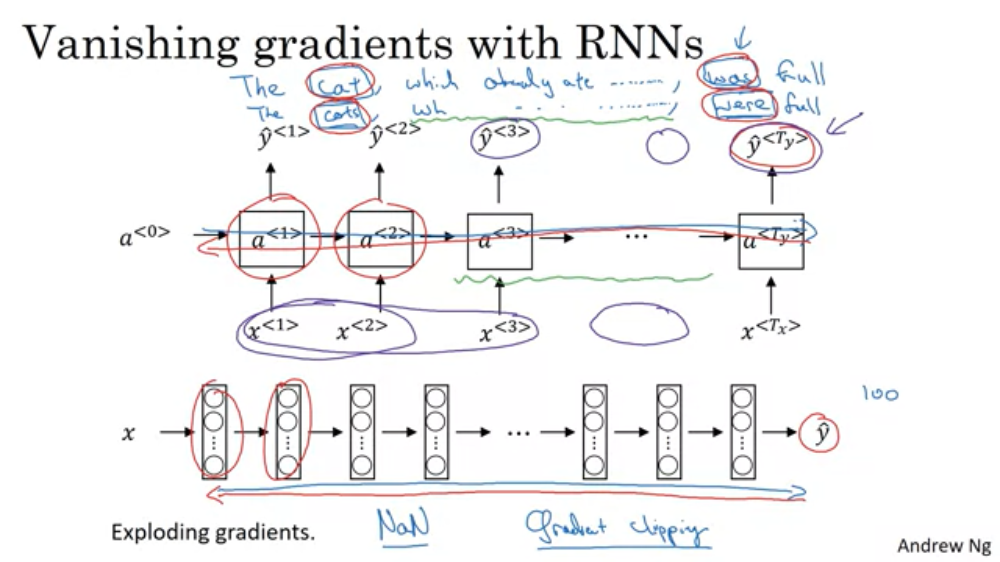

And it's difficult for the output here to be strongly influenced by an input that was very early in the sequence. And this is because whatever the output is, whether this got it right, this got it wrong, it's just very difficult for the area to backpropagate all the way to the beginning of the sequence, and therefore to modify how the neural network is doing computations earlier in the sequence. <br>
`So this is a weakness of the basic RNN algorithm. `

 Exploding gradients, you could sort of address by just using gradient clipping, but vanishing gradients will take more work to address. So what we do in the next video is talk about GRU, the greater recurrent units, which is a very effective solution for addressing the vanishing gradient problem and will allow your neural network to capture much longer range dependencies